In [ ]:
from google.colab import drive
drive.mount("/content/drive/", force_remount=True)

Mounted at /content/drive/


<div style="display: flex; flex-direction: column; align-items: center; justify-content: center; gap: 10px;">
    <a href="https://www.hapri.org/" target="_blank" style="transition: transform 0.2s;">
        <img src="https://media.licdn.com/dms/image/v2/C510BAQHfKKEcpmwqnQ/company-logo_200_200/company-logo_200_200/0/1630623930351?e=1749686400&amp;v=beta&amp;t=lHyn6J1Qg4cUQcmf7CcOUvRiMN4WzggNO40SO2yZQXI"
             width="100"
             alt="HAPRI - Viện Nghiên cứu Chính sách Nông nghiệp & Sức khỏe"
             style="border-radius: 10px;">
    </a>
    <h1 style="text-align: center; font-size: 26px; font-weight: bold; font-family:'Nunito'; color: purple;">
        Chapter 1
    </h1>
</div>


**Gọi các gói cần thiết trong chương 1**

In [130]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt #from matplotlib import pyplot as plt
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go
from google.colab import data_table
from scipy.stats import kurtosis

In [ ]:
# Bảng màu mẫu
palette = ["#53b0ae", "#a31414", "#2b6999", "#e37000", "#b2c615", "#88837d","#B3B3B3"]
labels = ["cyan", "Red", "Dark Blue", "Orange", "Green", "Gray","Light Gray"]

In [131]:
def sumdetail(df, column):
    """ Hiển thị thống kê chi tiết của một biến số giống Stata 'sum, detail' """

    # Tính các percentiles
    percentiles = [1, 5, 10, 25, 50, 75, 90, 95, 99]
    x = df[column].dropna()
    percentile_values = np.percentile(x, percentiles)

    # Các thống kê khác
    obs = x.count()
    total = x.sum()
    mean = x.mean()
    std_dev = x.std()
    variance = x.var()
    skewness = x.skew()
    kurt = kurtosis(x, fisher=False)  # Nếu không dùng tuỳ chọn fisher=False kết quả của bạn phải trừ đi 3 để giống kết quả Stata
    smallest = x.nsmallest(3).values
    largest = x.nlargest(3).values

    # Hiển thị kết quả
    print(f"{column.upper()}\n" + "-"*60)
    print(f"{'Percentiles':<15}{'Smallest':<15}")
    for i in range(len(percentiles)):
        if i < 3:
            print(f"{percentiles[i]:<5}{percentile_values[i]:<15,.2f}{smallest[i]:<15,.2f}")
        else:
            print(f"{percentiles[i]:<5}{percentile_values[i]:<15,.2f}")

    print(f"\n{'Obs':<20}{obs:,}")
    print(f"{'Sum':<20}{total:,.2f}")
    print(f"{'Mean':<20}{mean:,.2f}")
    print(f"{'Std. Dev.':<20}{std_dev:,.2f}")
    print(f"{'Variance':<20}{variance:,.2f}")
    print(f"{'Skewness':<20}{skewness:.6f}")
    print(f"{'Kurtosis':<20}{kurt:.6f}")
    print(f"\n{'Largest':<15}")
    for i in range(3):
        print(f"{largest[i]:,.2f}")

In [45]:
df = pd.read_stata("/content/drive/MyDrive/econometrics/rawdata/migration_remittances_16_full.dta")
data_table.DataTable(df)

<ipython-input-45-66e217904f44>:1: UnicodeWarning:


One or more strings in the dta file could not be decoded using utf-8, and
so the fallback encoding of latin-1 is being used.  This can happen when a file
has been incorrectly encoded by Stata or some other software. You should verify
the string values returned are correct.



,tinh,huyen,xa,diaban,hoso,num_migration,marital_status,HHsize,agehead,num_children0_5,...,durables_share,housing_share,others_share,healthcare_share,education_share,RedRiverDelta,Northmidlandareas,CentralCoast,Centralhighlands,MekongRiverDelta
0,Ha Noi,1,4,8,14,NaN,0,2.0,63.0,0.0,...,0.000000,0.030590,0.021175,0.004854,0.044689,1.0,0.0,0.0,0.0,0.0
1,Ha Noi,1,4,8,15,NaN,1,5.0,37.0,0.0,...,0.026955,0.011273,0.006304,0.000797,0.006511,1.0,0.0,0.0,0.0,0.0
2,Ha Noi,1,4,8,19,NaN,1,2.0,61.0,0.0,...,0.000000,0.027630,0.013743,0.014355,0.000000,1.0,0.0,0.0,0.0,0.0
3,Ha Noi,1,7,6,13,NaN,1,3.0,62.0,0.0,...,0.018952,0.022694,0.014611,0.002366,0.056978,1.0,0.0,0.0,0.0,0.0
4,Ha Noi,1,7,6,14,NaN,1,5.0,62.0,0.0,...,0.000000,0.067794,0.004254,0.011658,0.002564,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9394,Ca Mau,973,32242,18,14,NaN,1,4.0,57.0,0.0,...,0.006153,0.003076,0.004692,0.004922,0.000000,0.0,0.0,0.0,0.0,1.0
9395,Ca Mau,973,32242,18,15,NaN,1,3.0,53.0,0.0,...,0.000000,0.007322,0.001611,0.115197,0.000000,0.0,0.0,0.0,0.0,1.0
9396,Ca Mau,973,32248,9,13,NaN,1,5.0,45.0,0.0,...,0.000000,0.006577,0.005098,0.030914,0.004440,0.0,0.0,0.0,0.0,1.0
9397,Ca Mau,973,32248,9,14,NaN,1,4.0,36.0,0.0,...,0.000000,0.005244,0.007342,0.013635,0.005874,0.0,0.0,0.0,0.0,1.0


In [42]:
df.loc[0:19, ['per_expenditure', 'remittances']].map(lambda x: f"{x:.1f}")


,per_expenditure,remittances
0,57732.0,60000.0
1,119605.6,65000.0
2,59211.5,5000.0
3,54523.7,7000.0
4,66294.8,10000.0
5,147202.5,8000.0
6,46908.5,10000.0
7,65866.0,7000.0
8,38047.7,6000.0
9,37322.0,10000.0


Thống kê mô tả chi tiết

In [132]:
sumdetail(df, 'per_expenditure')

PER_EXPENDITURE
------------------------------------------------------------
Percentiles    Smallest       
1    4,963.69       1,439.00       
5    7,885.75       1,759.50       
10   10,057.20      2,054.80       
25   14,447.17      
50   21,311.50      
75   32,136.83      
90   46,488.60      
95   58,830.10      
99   105,417.56     

Obs                 9,399
Sum                 250,343,984.00
Mean                26,635.17
Std. Dev.           22,829.52
Variance            521,187,072.00
Skewness            5.771964
Kurtosis            64.152252

Largest        
457,283.25
363,633.00
362,254.50


Vẽ biểu đồ histogram

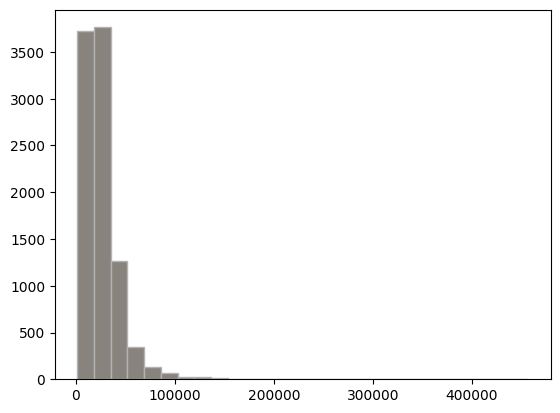

In [57]:
plt.hist(df["per_expenditure"], bins=27, edgecolor=palette[6], color=palette[5])
plt.show()

In [52]:
min_val = df["per_expenditure"].min()
max_val = df["per_expenditure"].max()
bin_size = (max_val - min_val) / 27  # Chia thành 27 khoảng

# Tạo biểu đồ
fig = go.Figure(go.Histogram(
    x=df["per_expenditure"],
    histnorm="percent",
    xbins=dict(start=min_val, end=max_val, size=bin_size)  # Chia bin theo kích thước cố định
))
# Cập nhật viền màu cho các cột
fig.update_traces(marker=dict(color= palette[5], line=dict(width=1,color= palette[6])))
fig.show()

In [ ]:
mean_value = df['per_expenditure'].mean() #Trung bình
print(f"mean: {mean_value}")

mean: 26635.171875


In [ ]:
median_value = np.percentile(df['per_expenditure'], 50) #Trung vị
print(f"median: {median_value}")

median: 21311.5


In [ ]:
percentile_25 = np.percentile(df['per_expenditure'], 25)  # Tính bách phân vị 25
#or percentile_25 = df['per_expenditure'].quantile(0.25) with pandas
print("25th percentile:", percentile_25)

25th percentile: 14447.166


In [ ]:
percentile_75 = np.percentile(df['per_expenditure'], 75)  # Tính bách phân vị 75
print("75th percentile:", percentile_75)

75th percentile: 32136.832


In [ ]:
std_dev = df['per_expenditure'].std()       # Độ lệch chuẩn
print(f"Standard Deviation: {std_dev}")

Standard Deviation: 22829.521484375


In [ ]:
variance = df['per_expenditure'].var()      # Phương sai
print(f"Variance: {variance}")

Variance: 521187072.0


In [134]:
df1 = pd.read_stata("/content/drive/MyDrive/econometrics/rawdata/GDP_population.dta")
data_table.disable_dataframe_formatter()
# Hoặc chỉ hiển thị DataFrame cụ thể
data_table.DataTable(df1)

,province,population,GDP,region,PCI
0,Hà Nội,8.4357,1190.27727,1,66.735939
1,Vĩnh Phúc,1.1976,153.41256,1,68.906227
2,Bắc Ninh,1.4882,248.08294,1,69.083672
3,Quảng Ninh,1.3629,266.17437,1,72.949509
4,Hải Dương,1.9468,170.73436,1,65.218483
...,...,...,...,...,...
58,Cần Thơ,1.2523,108.57441,5,66.944916
59,Hậu Giang,0.7295,49.38715,5,68.121300
60,Sóc Trăng,1.1978,66.23834,5,65.165794
61,Bạc Liêu,0.9218,54.66274,5,60.360783


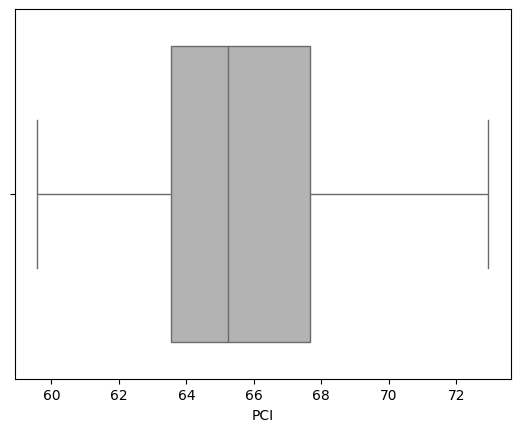

In [118]:
sns.boxplot(x='PCI', data=df1, orient='h',color= palette[6])
plt.show()

In [144]:
fig = go.Figure(go.Box(
    x=df1['PCI'],
    boxpoints='outliers',  # Hiển thị các outliers
    orientation='h',# Horizontal boxplot
    name='',
    marker=dict(
        color=palette[5],
        line=dict(color=palette[6])
    ),
))
fig.show()

In [59]:
df2=pd.read_stata("/content/drive/MyDrive/econometrics/rawdata/wage2020.dta")

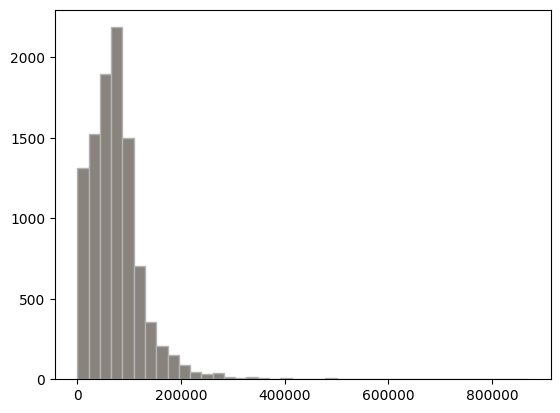

In [64]:
plt.hist(df2["wage"], bins=40, edgecolor=palette[6], color=palette[5])
plt.show()

In [79]:
df3=pd.read_excel("/content/drive/MyDrive/econometrics/rawdata/grade.xlsx")
data_table.DataTable(df3)

,grade,frequency
0,0.0,14
1,0.2,0
2,0.4,1
3,0.6,6
4,0.8,12
5,1.0,43
6,1.2,126
7,1.4,278
8,1.6,619
9,1.8,1156


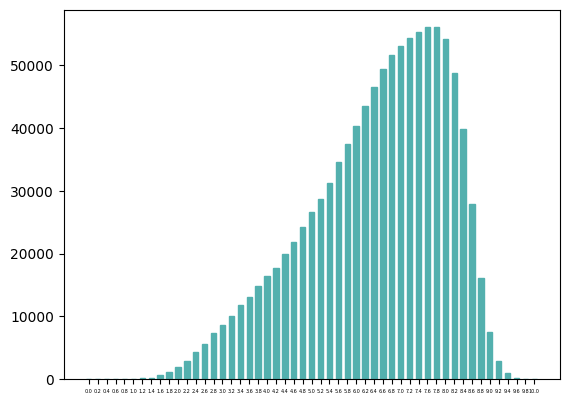

In [112]:
# Vẽ biểu đồ cột
plt.bar(df3["grade"].astype(str), df3["frequency"], width=0.6, color=palette[0], edgecolor=palette[0])
plt.xticks(fontsize=3.5)
plt.show()

In [101]:
df4=pd.read_stata("/content/drive/MyDrive/econometrics/rawdata/remittances_adolescents1.dta")
data_table.DataTable(df4)

<ipython-input-101-736a9fbc6a52>:1: UnicodeWarning:


One or more strings in the dta file could not be decoded using utf-8, and
so the fallback encoding of latin-1 is being used.  This can happen when a file
has been incorrectly encoded by Stata or some other software. You should verify
the string values returned are correct.



,tinh,huyen,xa,diaban,hoso,m1ama1,num_edu_adolescents,adolescent_gender,m1ac5,HHsize,adolescent6_18_ratio,adolescent0_15_ratio
0,Thành ph? Hà N?i,1,4,8,15,3,2,1,8,5.0,0.400000,0.400000
1,Thành ph? Hà N?i,1,7,6,13,3,7,0,13,3.0,0.333333,0.333333
2,Thành ph? Hà N?i,1,7,6,20,3,8,1,14,4.0,0.500000,0.500000
3,Thành ph? Hà N?i,1,7,6,20,4,4,0,10,4.0,0.500000,0.500000
4,Thành ph? Hà N?i,1,16,13,15,4,5,0,11,4.0,0.250000,0.250000
...,...,...,...,...,...,...,...,...,...,...,...,...
6369,T?nh Cà Mau,973,32248,9,13,3,5,0,17,5.0,0.600000,0.400000
6370,T?nh Cà Mau,973,32248,9,13,4,5,0,15,5.0,0.600000,0.400000
6371,T?nh Cà Mau,973,32248,9,13,5,5,1,12,5.0,0.600000,0.400000
6372,T?nh Cà Mau,973,32248,9,14,3,3,0,9,4.0,0.500000,0.500000


In [104]:
# Dùng bins rời rạc theo số nguyên duy nhất
bins = sorted(df4["num_edu_adolescents"].unique())


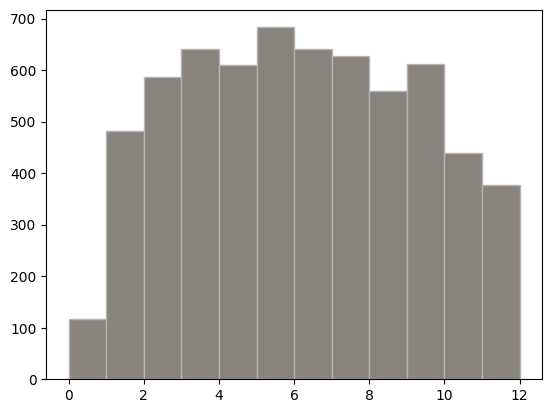

In [114]:
plt.hist(df4["num_edu_adolescents"], bins=bins, color=palette[5], edgecolor=palette[6])
plt.show()

In [133]:
sumdetail(df4,'num_edu_adolescents')

NUM_EDU_ADOLESCENTS
------------------------------------------------------------
Percentiles    Smallest       
1    0.00           0.00           
5    1.00           0.00           
10   2.00           0.00           
25   3.00           
50   6.00           
75   8.00           
90   10.00          
95   11.00          
99   11.00          

Obs                 6,374
Sum                 36,233.00
Mean                5.68
Std. Dev.           3.05
Variance            9.29
Skewness            0.061907
Kurtosis            1.964521

Largest        
12.00
12.00
12.00


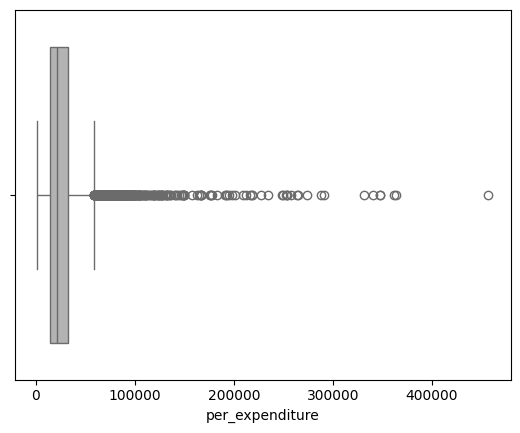

In [140]:
a=sns.boxplot(x='per_expenditure', data=df, orient='h',color= palette[6])
plt.show()

In [147]:
fig = go.Figure(go.Box(
    x=df['per_expenditure'],
    boxpoints='outliers',  # Hiển thị các outliers
    orientation='h',       # Horizontal boxplot
    name='',
    marker=dict(
        color=palette[5],
        line=dict(color=palette[6])
    ),
))
fig.show()

In [159]:
Q1 = df["per_expenditure"].quantile(0.25)
Q3 = df["per_expenditure"].quantile(0.75)
IQR = Q3 - Q1
lower_fence = Q1 - 1.5 * IQR
upper_fence = Q3 + 1.5 * IQR
print("Q1:", Q1)
print("Q3:", Q3)
print("IQR:", IQR)


Q1: 14447.16650390625
Q3: 32136.8330078125
IQR: 17689.66650390625


In [160]:
df["outlier_per_expenditure"] = (
    (df["per_expenditure"] < lower_fence) | (df["per_expenditure"] > upper_fence)
).astype(int)


In [161]:
df["outlier_per_expenditure"].value_counts()

,count
outlier_per_expenditure,
0,8927
1,472


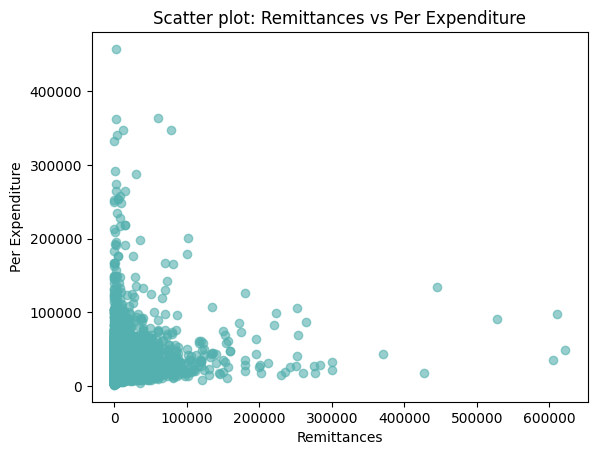

In [166]:
plt.scatter(df["remittances"], df["per_expenditure"], color=palette[0], alpha=0.6)
plt.xlabel("Remittances")
plt.ylabel("Per Expenditure")
plt.title("Scatter plot: Remittances vs Per Expenditure")
plt.show()

 1. Ma trận tương quan (correlation)

In [169]:
correlation = df[["per_expenditure", "remittances"]].corr()
correlation


,per_expenditure,remittances
per_expenditure,1.000000,0.136289
remittances,0.136289,1.000000


2. Ma trận hiệp phương sai (covariance)

In [172]:
covariance = df[["per_expenditure", "remittances"]].cov()
covariance

,per_expenditure,remittances
per_expenditure,5.211867e+08,7.560522e+07
remittances,7.560522e+07,5.904581e+08
